## CS4243 Lab 4: Optical Flow and Textons

**ASSIGNMENT SUBMISSION DEADLINE: Apr 18, 22h00**

**Instructions:**
- See `lab4.pdf` and `lab4.py` for detailed descriptions.

- The functions to be implemented are given in `lab4.py`, with a description of each function. You will need to fill in the code where it is marked with the following:
    ```
    """ Your code starts here """

    """ Your code ends here """
    ```
    
- For open questions, write your answers directly into the notebook. 

- You are free to use NumPy, OpenCV, scipy and skimage functions.

**Attention:**
- Please use python with version >= 3.8.4, and install the libs provided in requirements.txt via `conda install -c conda-forge ffmpeg ` and `pip install -r requirements.txt`.
- Please do not change the structure of files in the whole folder of this assignment, otherwise TA may mark your code wrongly.
- Please do not change the inputs arguments of the functions in `lab4.py`, otherwise your implementation would fail to pass the test.
- The functions in `utils.py` are to help us and should not have to be changed. Nonetheless, feel free to make adjustments if there are issues on your end.
- As long as your output is close to the expected answer, you will get full credit.

**Submission instructions:**

Upload to Canvas your completed lab4.py and lab4.ipynb by zipping them into a file named AXXX1_AXXX2.zip, where AXXX is the student number of the group members.  Submit one file per group.  Missing files, incorrectly formatted code that does not run, etc. will be penalized. 

If you have any question regarding this lab, do not hesistate to ask questions under the Labs section on Canvas Discussions. You can also attend any lab slot for FAQs.



To begin, load the following packages:


In [1]:
%load_ext autoreload
%autoreload 2

from lab4 import *
from utils import *
from tqdm import tqdm
from IPython.display import HTML

import os
os.environ["OMP_NUM_THREADS"] = "4" # export OMP_NUM_THREADS=4

## Part 1: Horn-Schonck Optical Flow

Run following code cell to load the video.

In [2]:
# load frames
path = "blackswan"

frames = load_frames_rgb(path)
testing_seq = frames[:10]
# video visualization
ani = animated_frames(frames)
display(HTML(ani.to_html5_video()))
plt.close()

In order to predict the segmentation of moving objects and background in the entire video. The very naive idea is to predict the segmentation by K-mean on pixel RGB features. The following code cell does this on the fisrt frame. 


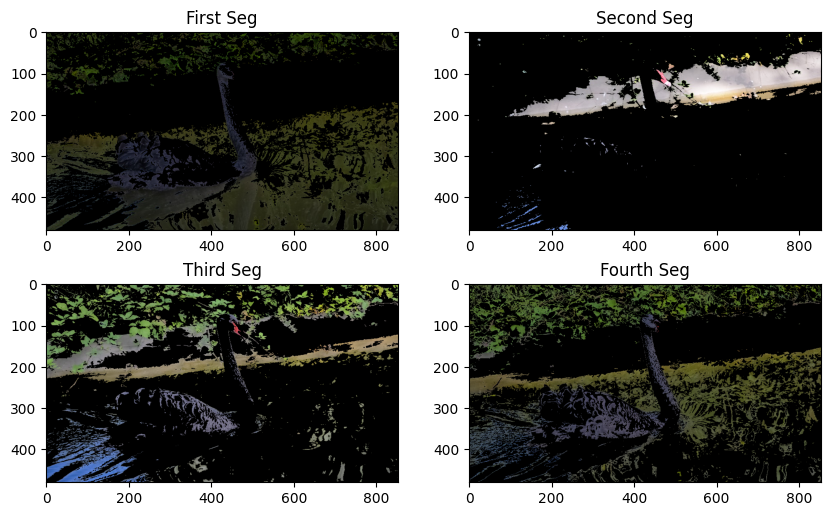

In [8]:
results = []
K=4

img = testing_seq[0]
label = kmeans(K, img)
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)


fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

To obtain the segmentation of the complete testing sequence, run the following cell:

In [9]:
results = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on RGB values'):
    label = kmeans(4, img)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB values: 10it [00:01,  8.82it/s]


Using only RGB values for segmentation cannot achieve the desired results. 
It can be observed that the movement of the swan is distinguishable from the background, so we use motion or displacement as features for segmentation.

**TASK 1.1: Complete `calcOpticalFlowHS()` in `lab4.py`. Run following code and tweak suitable smoothing parameter `lambda` and threshold `delta`.**

In [44]:
%%time
flows = []
vis = []

for i in tqdm(range(len(testing_seq)-1), desc='compute optical flow'):
    prvs = testing_seq[i]
    hsv = np.zeros_like(prvs)
    prvs = cv2.cvtColor(prvs, cv2.COLOR_BGR2GRAY)
    next = testing_seq[i+1]
    next = cv2.cvtColor(next, cv2.COLOR_BGR2GRAY)
    hsv[..., 1] = 255
    flow = calcOpticalFlowHS(prvs, next, param_lambda = 15, param_delta = 10**-1)
    mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    hsv[..., 0] = ang*180/np.pi/2
    hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    
    flows.append(flow) 
    vis.append(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))

ani = animated_frames(vis)
display(HTML(ani.to_html5_video()))
plt.close()

compute optical flow:   0%|          | 0/9 [00:00<?, ?it/s]/Users/isaactan/Downloads/Release 2/lab4.py:62: RuntimeWarning: overflow encountered in multiply
  iter_counter += 1
/Users/isaactan/Downloads/Release 2/lab4.py:62: RuntimeWarning: invalid value encountered in multiply
  iter_counter += 1
/Users/isaactan/Downloads/Release 2/lab4.py:63: RuntimeWarning: overflow encountered in multiply
  u_avg = convolve(u, avg_kernel)
/Users/isaactan/Downloads/Release 2/lab4.py:63: RuntimeWarning: invalid value encountered in multiply
  u_avg = convolve(u, avg_kernel)
/Users/isaactan/Downloads/Release 2/lab4.py:62: RuntimeWarning: overflow encountered in add
  iter_counter += 1
/Users/isaactan/Downloads/Release 2/lab4.py:62: RuntimeWarning: invalid value encountered in subtract
  iter_counter += 1
/Users/isaactan/Downloads/Release 2/lab4.py:63: RuntimeWarning: overflow encountered in add
  u_avg = convolve(u, avg_kernel)
/Users/isaactan/Downloads/Release 2/lab4.py:63: RuntimeWarning: invalid val

Run K-means on HornSchunck optical flow for the first frame. 
You will see the main object is well segmented. However, the background is noisy. 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


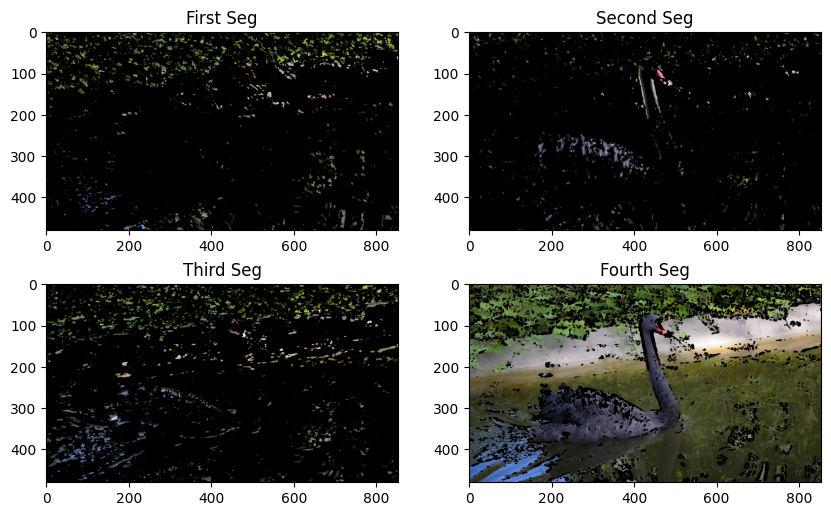

CPU times: user 1.99 s, sys: 192 ms, total: 2.18 s
Wall time: 1.29 s


In [43]:
%%time
results = []
K=4

img = testing_seq[0]
label = kmeans(K, flows[0])
out = color.label2rgb(label, img, bg_label=0)
segs = []
for i in range(K):
    seg = img.copy()
    seg[label!=i]=0
    segs.append(seg)

fig, axs = plt.subplots(2, 2, figsize=(10, 6))

axs[0, 0].imshow(segs[0])
axs[0, 0].set_title('First Seg')
axs[0, 1].imshow(segs[1])
axs[0, 1].set_title('Second Seg')
axs[1, 0].imshow(segs[2])
axs[1, 0].set_title('Third Seg')
axs[1, 1].imshow(segs[3])
axs[1 ,1].set_title('Fourth Seg')

plt.show()

Run the following cell to get the segmentation of the complete testing sequence.

In [10]:
results = []
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on flow feature'):
    label = kmeans(4, flow)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on flow feature: 0it [00:00, ?it/s]/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on flow feature: 1it [00:00,  7.82it/s]/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean segmentation on flow feature: 2it [00:00,  8.57it/s]/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
k-mean s

We then combine the appearance and motion evidence: concatenate the RGB values and optical flow to form the aggregated feature, and consider reweighting features for better results. 

**TASK 1.2: Complete `combine_and_normalize_features()` in `lab4.py`. Run following code and tweak suitable weighting parameter `gamma`.**

In [11]:
results = []
gamma = 5
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=testing_seq[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 0it [00:00, ?it/s]


NameError: name 'feats' is not defined

- **How do the parameters `lambda` and `delta` affect the optical flow results?**

- **How does the weighting parameter `gamma` affect the final segmentation results?**


After adding appearance information, the white wall was effectively segmented, but the complex leaves were not. In the next section, we will use textons as features for segmentation.

## Section 2: Textons

The image is convolved with a 17-dimensional filter-bank at scale κ. The filter-bank consists of Gaussians at scales κ, 2κ and 4κ, x and y derivatives of Gaussians at scales 2κ and 4κ, and Laplacians of Gaussians at scales κ, 2κ, 4κ and 8κ.
Run following code to visualize them.


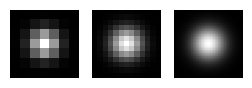

In [3]:
# Gaussians at scales κ, 2κ and 4κ

kappa = 1
kernels = {}

kernels['gaussian']=[]
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(3,1))  

for i, sigma in enumerate([kappa, 2*kappa, 4*kappa]):
    kg = build_gaussian_kernel(sigma=sigma)
    kernels['gaussian'].append(kg)
    ax[i].imshow(kg, cmap = 'gray')
    ax[i].axis("off")
    
plt.show()


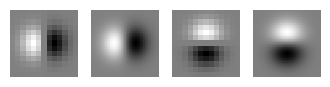

In [4]:
# x and y derivatives of Gaussians at scales 2κ and 4κ

kernels['gaussian_derivative']=[]
ydg2, xdg2 = build_gaussian_derivative_kernel(sigma=2*kappa)
ydg4, xdg4 = build_gaussian_derivative_kernel(sigma=4*kappa)

fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
ax[0].imshow(xdg2, cmap = 'gray')
ax[0].axis("off")
ax[1].imshow(xdg4, cmap = 'gray')
ax[1].axis("off")
ax[2].imshow(ydg2, cmap = 'gray')
ax[2].axis("off")
ax[3].imshow(ydg4, cmap = 'gray')
ax[3].axis("off")
plt.show()

kernels['gaussian_derivative'] = [ydg2, ydg4, xdg2, xdg4]

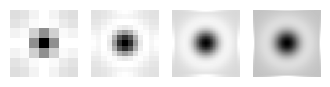

In [5]:
# Laplace of Gaussians at scales κ, 2κ and 4κ, 8k

kernels['LoG']=[]
fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(4,1))  
for i, sigma in enumerate([kappa, 2*kappa, 4*kappa, 8*kappa]):
    klg = build_LoG_kernel(sigma=sigma)
    ax[i].imshow(klg, cmap = 'gray')
    ax[i].axis("off")
    kernels['LoG'].append(klg)

plt.show()


After buiding the filter bank, run following code to load training image,  The Microsoft Research Cambridge (MSRC) database2 is composed of 591 photographs of the following 21 object classes: building, grass, tree, cow, sheep, sky, airplane, water, face, car, bicycle, flower, sign, bird, book, chair, road, cat, dog, body, and boat. Examples are shown below:

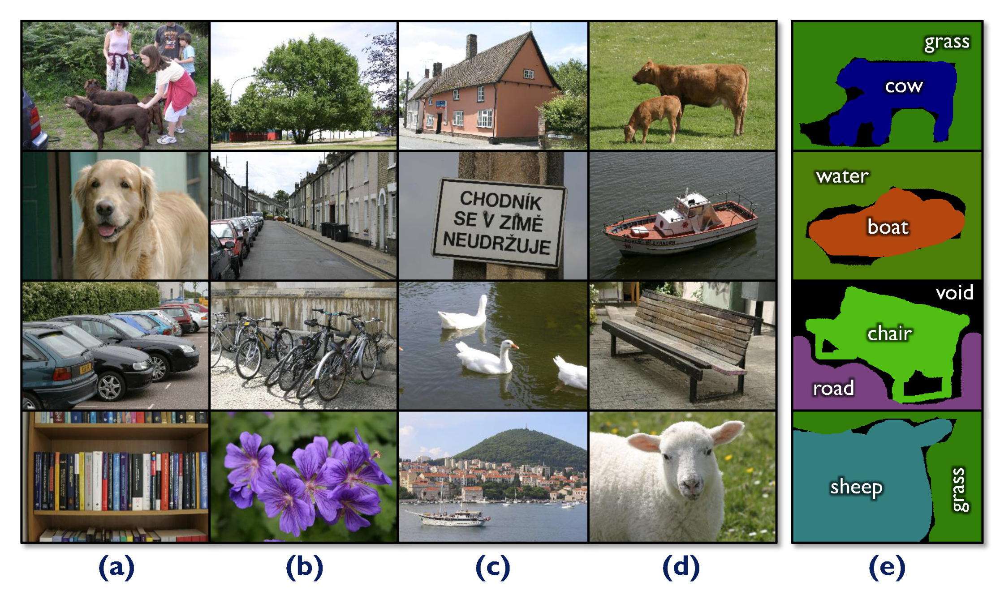

In [6]:
with open('Train.txt') as f:
    frames = f.read().splitlines()
training_imgs = [cv2.cvtColor(cv2.imread(os.path.join('MSRC_v2', frame)), cv2.COLOR_BGR2RGB) for frame in frames]
print(len(training_imgs))

276


**TASK 2.1: Complete `features_from_filter_bank()` in `lab4.py`.**

Run following code to visualize the filter response for the first training image.


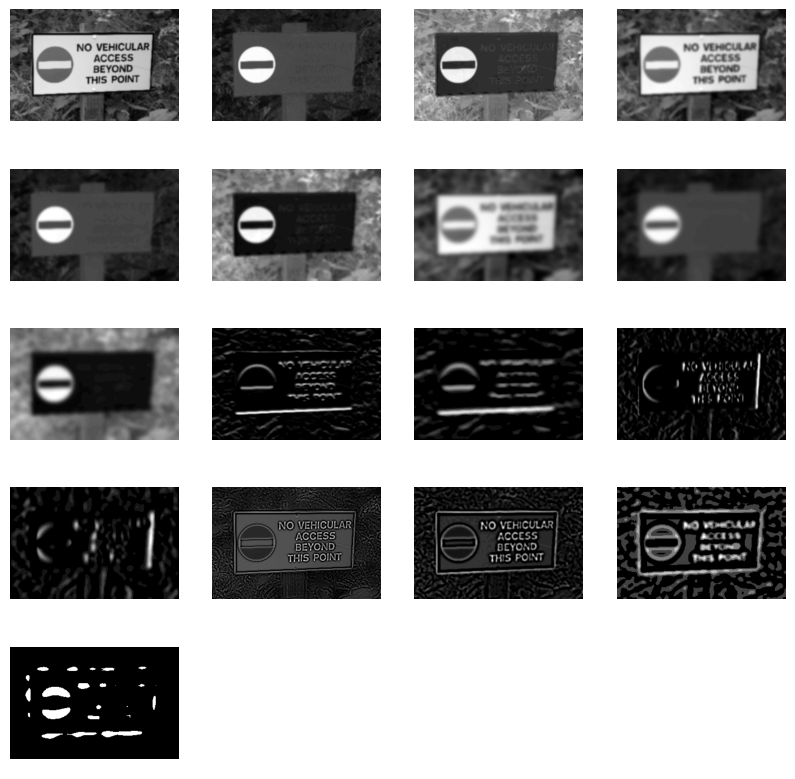

CPU times: total: 484 ms
Wall time: 483 ms


In [16]:
%%time

fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(10,10))

c = features_from_filter_bank(training_imgs[0], kernels)

for i in range(20): 
    if i<17:
        ax[i//4, i%4].imshow(c[:,:,i], cmap = 'gray')
    ax[i//4, i%4].axis("off")
plt.show()

Next, you will learn the textons by clustering the training data (The Microsoft Research Cambridge (MSRC) database2) using the K-mean algorithm. 

**TASK 2.2: Implement `Textonization()` class in `lab4.py`.**

In [14]:
%%time
results = []

textonization = Textonization(kernels, n_clusters=7)
textonization.training(training_imgs)
gamma = 5
textures = []
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    feats = textonization.testing(img)
    textures.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on textons: 10it [00:03,  2.94it/s]


CPU times: total: 3min 7s
Wall time: 11.5 s


**TASK 2.3: Complete `histogram_per_pixel()` in `lab4.py`.**

In [15]:

%%time
results = []
histogram_feat=[]
gamma = 5
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    texture = textures[i]
    feats = histogram_per_pixel(texture, window_size=49)
    histogram_feat.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on textons: 10it [06:56, 41.64s/it]


CPU times: total: 7min 25s
Wall time: 6min 57s


In [17]:

%%time
results = []
histogram_feat=[]
gamma = 5
for i, img in tqdm(enumerate(testing_seq),desc='k-mean segmentation on textons'):
    texture = textures[i]
    feats = histogram_per_pixel(texture, window_size=23)
    histogram_feat.append(feats)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()


k-mean segmentation on textons: 10it [05:38, 33.80s/it]


CPU times: total: 6min 7s
Wall time: 5min 38s


- **How does the window size of the texton histogram impact the final results?** 
- The window size would affect the size and the number of segmentations found in the image. A larger window size would allow for more spatial information to be captured which would allow for larger features to be detected. However, due to having much more pixels, it would not be able to pick up fine details as well.

A smaller window size on the other hand would be able to pick up finer detail, and allow for the capture of smaller segmentations.

This would also affect the total segmentation count, as there would be more segmentations when smaller window sizes are used. Hence, based on the goal of the segmentation, various segment sizes can be experimented with, and validated.

- **Compared to segmentation based only on texton ID, what are the advantages and disadvantages? Please explain your reasoning. Hint: analyze the boundary.**

Using segmentation using texton ID leads to finer details being detected, however it would result in many abrupt boundaries. This is because it does not take spatial features into account, resulting in small changes in colour and/or illumination of the same texture to be classified as a different texture. However, when compared to the texton histogram approach, it is a lot more computationally efficient as it only iterates through the pixels once.

Segmentation using texton histograms, takes into consideration both the appearance as well as the spatial information of the image. This allows for more accurate boundaries to be drawn, and provide with more meaningful segmentations. From the image above it can be seen that this approach is better able to segment the swan, the white wall and the grass. However, as this approach uses a sliding window and going through the same pixels multiple times, it is a lot more computationally expensive.




## Section 3: Segmentations with Optical Flow and Textons

In the final step, you need to combine the optical flow feature from Part 1 with the texture features obtained from Part 2.

**TASK 3.1: Adjust `gamma` for better results.**

In [19]:
results = []
gamma = 3
for i, flow in tqdm(enumerate(flows),desc='k-mean segmentation on RGB feature'):
    feats = combine_and_normalize_features(feat1=histogram_feat[i], feat2=flow, gamma=gamma)
    label = kmeans(4, feats)
    # out = color.label2rgb(label, img, kind='avg', bg_label=0)
    out = segmentation.mark_boundaries(testing_seq[i], label, color=(1, 1, 0), outline_color=(1,1,1), mode='inner')
    results.append(out)
# video visualization
ani = animated_frames(results)
display(HTML(ani.to_html5_video()))

plt.close()

k-mean segmentation on RGB feature: 9it [00:17,  1.96s/it]
